# Template Notebook for using an Island Model GA with Style Evolution on Islands
Notebook Version: 0.5 (27/03/2024)
* update to new evolutionary library, changes to GA, plotting statistics

## Google Colab Setup

In [ ]:
# Google Colab: Execute this to install packages and setup drive
!pip install "evolutionary[all] @ git+https://git@github.com/malthee/evolutionary-diffusion.git"

In [ ]:
# Mount drive to save results
from google.colab import drive
import evolutionary_imaging.processing as ip
drive.mount("/content/drive")
base_path = "/content/drive/MyDrive/evolutionary/"
ip.RESULTS_FOLDER = base_path + ip.RESULTS_FOLDER

In [ ]:
# Check if GPU is available
import torch
print(torch.cuda.is_available())

## Project Setup

In [1]:
from evolutionary.plotting import plot_fitness_statistics, plot_time_statistics
import evolutionary_imaging.processing as ip
from diffusers.utils import logging
from evolutionary_imaging.processing import create_animation_from_generations, create_generation_image_grid, save_images_from_generation
import torch
import os

In [2]:
logging.disable_progress_bar() # Or else your output will be full of progress bars
logging.set_verbosity_error() # Enable again if you are having problems
os.environ["TOKENIZERS_PARALLELISM"] = "false" # To remove warning of libraries using tokenizers
# Change the results folder for images if you want to 
# ip.RESULTS_FOLDER = 'choose_your_destination'

class SaveImagesPostEvaluation:  # Class to save images and difference between islands; used to allow pickling
    def __init__(self, ident):
        self.ident = ident

    def __call__(self, g, a):
        return save_images_from_generation(a.population, g, self.ident)

# Check torch random state, used across all libraries. Caution setting fixed seeds as it affects not only generation but also variation.
print(torch.random.get_rng_state())

tensor([ 64, 169,  29,  ...,   0,   0,   0], dtype=torch.uint8)


In [3]:
from evolutionary_prompt_embedding.argument_types import PooledPromptEmbedData
from evolutionary_prompt_embedding.image_creation import SDXLPromptEmbeddingImageCreator
from evolutionary_prompt_embedding.variation import \
    UniformGaussianMutatorArguments, PooledUniformGaussianMutator, PooledArithmeticCrossover, PooledUniformCrossover
from evolutionary_prompt_embedding.value_ranges import SDXLTurboEmbeddingRange, SDXLTurboPooledEmbeddingRange
from evolutionary.evolutionary_selectors import TournamentSelector, RouletteWheelSelector, RankSelector
from evolutionary.evaluators import CappedEvaluator, GoalDiminishingEvaluator, MultiObjectiveEvaluator
from evolutionary.algorithms.island_model import IslandModel
from evolutionary.algorithms.ga import GeneticAlgorithm
from evolutionary.algorithms.nsga_ii import NSGA_II, NSGATournamentSelector
from evolutionary_imaging.evaluators import AIDetectionImageEvaluator, AestheticsImageEvaluator, SingleCLIPIQAEvaluator

population_size = 10
num_generations = 30
batch_size = 1
elitism = None
inference_steps = 4
crossover_rate = 0.9
mutation_rate = 0.3

artists = [
    "Leonardo da Vinci",  # Renaissance, polymath
    "Michelangelo Buonarroti",  # Renaissance, sculptor-painter
    "Rembrandt van Rijn",  # Dutch Golden Age, realism
    "Claude Monet",  # Impressionism, light and color
    "Vincent van Gogh",  # Post-Impressionism, emotional expression
    "Gustav Klimt",  # Symbolism, Art Nouveau
    "Wassily Kandinsky",  # Abstract art
    "Pablo Picasso",  # Cubism, modernism
    "Salvador Dalí",  # Surrealism
    "Jackson Pollock",  # Abstract Expressionism, drip painting
    "Georgia O'Keeffe",  # American modernism, nature
    "Andy Warhol",  # Pop Art, visual culture
    "Frida Kahlo",  # Surrealism, personal mythology
    "Jean-Michel Basquiat",  # Neo-expressionism, social commentary
    "Yayoi Kusama",  # Contemporary, avant-garde
    "Banksy"  # Street Art, Activism
]

embedding_range = SDXLTurboEmbeddingRange()
pooled_embedding_range = SDXLTurboPooledEmbeddingRange()

creator = SDXLPromptEmbeddingImageCreator(batch_size=batch_size, inference_steps=inference_steps)
# Above this score the AestheticsImageEvaluator is biased to specific styles, use it more as quality control and leave it open 
evaluator = AestheticsImageEvaluator()
crossover = PooledArithmeticCrossover(interpolation_weight=0.8, interpolation_weight_pooled=0.8) # Try keeping original style more 
mutation_arguments = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=1.5, 
                                                     clamp_range=(embedding_range.minimum, embedding_range.maximum)) 
mutation_arguments_pooled = UniformGaussianMutatorArguments(mutation_rate=0.05, mutation_strength=0.4, 
                                                            clamp_range=(pooled_embedding_range.minimum, pooled_embedding_range.maximum))
mutator = PooledUniformGaussianMutator(mutation_arguments, mutation_arguments_pooled)
selector = RouletteWheelSelector()

ga_instances = []

init_crossover = PooledArithmeticCrossover(interpolation_weight=0.8, interpolation_weight_pooled=0.8)
for i, artist in enumerate(artists):
    artist_arg = creator.arguments_from_prompt(f"by {artist}") 
    init_args = [init_crossover.crossover(artist_arg,  # Combine the artist with a random image, weighted towards the artist
                                          PooledPromptEmbedData(embedding_range.random_tensor_in_range(), pooled_embedding_range.random_tensor_in_range())) 
                 for _ in range(population_size)]
    save_images_post_evaluation = SaveImagesPostEvaluation(i)
 
    ga_instances.append(GeneticAlgorithm(
        population_size=population_size,
        num_generations=num_generations,
        solution_creator=creator,
        evaluator=evaluator,
        mutator=mutator,
        crossover=crossover,
        selector=selector,
        initial_arguments=init_args,
        crossover_rate=crossover_rate,
        mutation_rate=mutation_rate,
        elitism_count=elitism,
        post_evaluation_callback=save_images_post_evaluation,
    ))

Loaded StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.27.2",
  "_name_or_path": "stabilityai/sdxl-turbo",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

Model loaded successfully.


In [6]:
island_model = IslandModel(
    ga_instances,
    migration_size=5,
    migration_interval=5,
)

In [7]:
best_solutions = island_model.run()

  0%|          | 0/30 [00:00<?, ?generation/s]

Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Muta

  3%|▎         | 1/30 [04:13<2:02:27, 253.35s/generation]

Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Cross

  7%|▋         | 2/30 [08:23<1:57:19, 251.42s/generation]

Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover


 10%|█         | 3/30 [12:36<1:53:24, 252.03s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutat

 13%|█▎        | 4/30 [16:47<1:49:02, 251.65s/generation]

Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Cr

 17%|█▋        | 5/30 [20:59<1:44:55, 251.83s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Cross

 20%|██        | 6/30 [25:12<1:40:50, 252.11s/generation]

Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mut

 23%|██▎       | 7/30 [29:22<1:36:29, 251.71s/generation]

Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crosso

 27%|██▋       | 8/30 [33:35<1:32:26, 252.10s/generation]

Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossov

 30%|███       | 9/30 [37:47<1:28:13, 252.09s/generation]

Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Cro

 33%|███▎      | 10/30 [42:00<1:24:04, 252.24s/generation]

Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover

 37%|███▋      | 11/30 [46:10<1:19:37, 251.47s/generation]

Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossov

 40%|████      | 12/30 [50:19<1:15:12, 250.69s/generation]

Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating


 43%|████▎     | 13/30 [54:29<1:11:01, 250.68s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Cross

 47%|████▋     | 14/30 [58:40<1:06:51, 250.74s/generation]

Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Cross

 50%|█████     | 15/30 [1:02:50<1:02:37, 250.47s/generation]

Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Cro

 53%|█████▎    | 16/30 [1:07:03<58:38, 251.35s/generation]  

Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover

 57%|█████▋    | 17/30 [1:11:11<54:14, 250.36s/generation]

Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutat

 60%|██████    | 18/30 [1:15:20<49:59, 249.95s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
C

 63%|██████▎   | 19/30 [1:19:30<45:47, 249.73s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Cross

 67%|██████▋   | 20/30 [1:23:40<41:39, 249.96s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Cros

 70%|███████   | 21/30 [1:27:50<37:28, 249.83s/generation]

Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover


 73%|███████▎  | 22/30 [1:31:59<33:16, 249.62s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossov

 77%|███████▋  | 23/30 [1:36:07<29:04, 249.23s/generation]

Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
M

 80%|████████  | 24/30 [1:40:16<24:55, 249.22s/generation]

Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutatin

 83%|████████▎ | 25/30 [1:44:24<20:44, 248.82s/generation]

Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mu

 87%|████████▋ | 26/30 [1:48:32<16:34, 248.61s/generation]

Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Cross

 90%|█████████ | 27/30 [1:52:41<12:26, 248.73s/generation]

Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Cross

 93%|█████████▎| 28/30 [1:56:50<08:17, 248.65s/generation]

Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Crossover
Mutating
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Mutating
Crossover
Crossover
Muta

100%|██████████| 30/30 [2:01:45<00:00, 243.51s/generation]


Best solution for epoch Leonardo da Vinci: 6.4482293128967285
Best solution for epoch Michelangelo Buonarroti: 6.487736701965332
Best solution for epoch Rembrandt van Rijn: 6.903292655944824
Best solution for epoch Claude Monet: 6.761740684509277
Best solution for epoch Vincent van Gogh: 6.421781063079834
Best solution for epoch Gustav Klimt: 6.652176380157471
Best solution for epoch Wassily Kandinsky: 6.447945594787598
Best solution for epoch Pablo Picasso: 6.446681022644043
Best solution for epoch Salvador Dalí: 6.836535930633545
Best solution for epoch Jackson Pollock: 6.231597423553467
Best solution for epoch Georgia O'Keeffe: 6.760731220245361
Best solution for epoch Andy Warhol: 6.299243450164795
Best solution for epoch Frida Kahlo: 6.31532096862793
Best solution for epoch Jean-Michel Basquiat: 6.088094711303711
Best solution for epoch Yayoi Kusama: 6.393192768096924
Best solution for epoch Banksy: 6.816352367401123


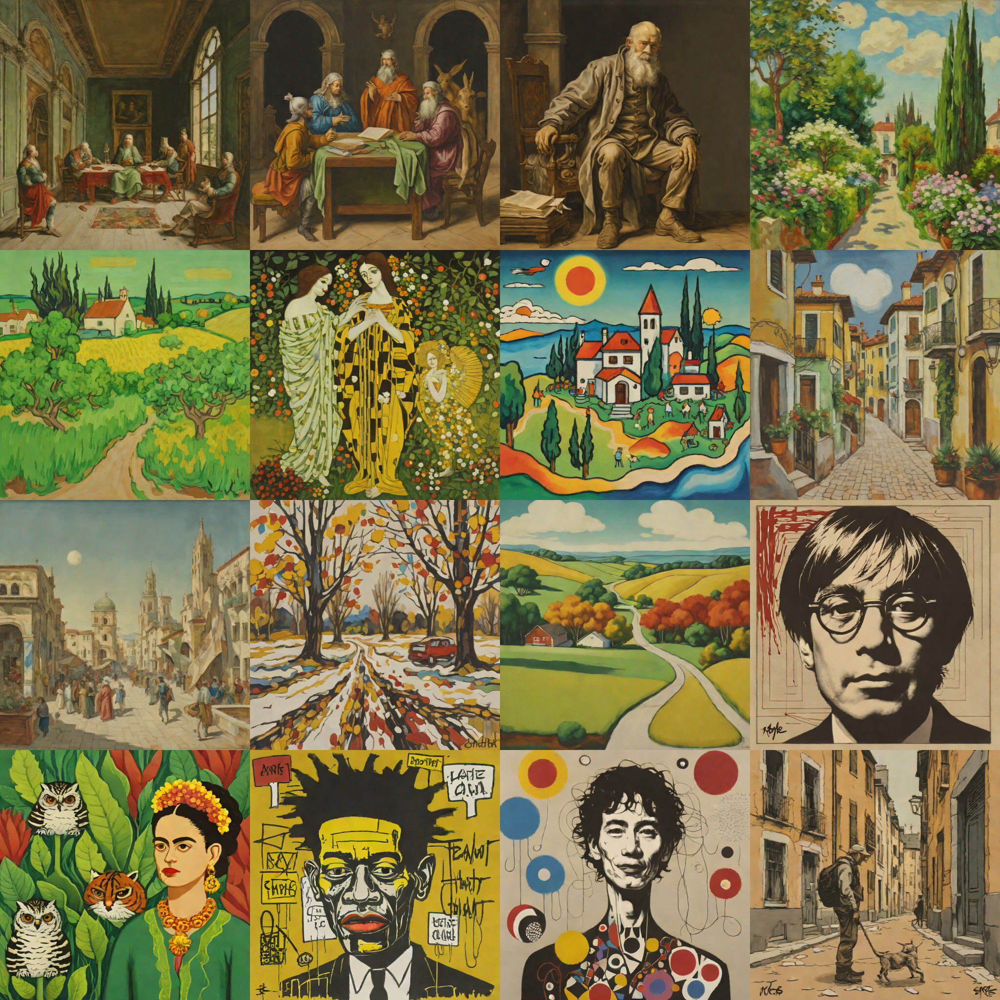

In [9]:
from diffusers.utils import make_image_grid

# Show best solution
for i, best_solution in enumerate(best_solutions):
    print(f"Best solution for epoch {artists[i]}: {best_solution.fitness}")

make_image_grid([image for solution in best_solutions for image in solution.result.images], 4, batch_size * len(best_solutions) // 4)

## Visualize the evolution

In [10]:
for gen in range(num_generations):
    create_generation_image_grid(gen, images_per_row=4, max_images=16, label_fontsize=10, ident_mapper=artists, group_by_ident=True)

In [11]:
video_loc = create_animation_from_generations(num_generations)
print(video_loc)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1500, 1350) to (1504, 1360) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


results/evolution.mp4


## Plot statistics

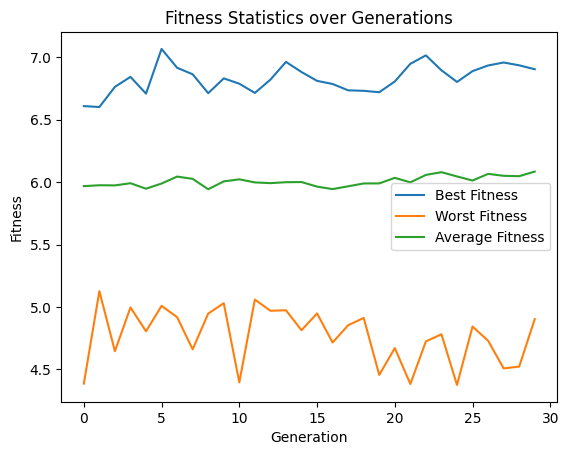

In [12]:
stats = island_model.statistics
plot_fitness_statistics(num_generations, stats.best_fitness, stats.worst_fitness, stats.avg_fitness)

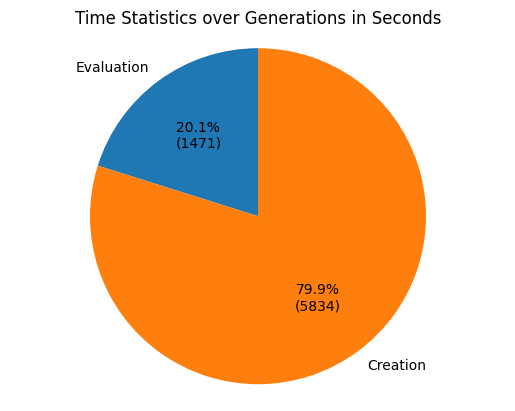

In [13]:
plot_time_statistics(stats.evaluation_time, stats.creation_time)

### Save the run to disk

In [14]:
import pickle
import os
from datetime import datetime

os.makedirs("saved_runs", exist_ok=True)
output_file = os.path.join("saved_runs", f"island_model_goodartists{datetime.now().strftime('%Y-%m-%d_%H-%M-%S')}.pkl")
with open(output_file, "wb") as f:
    pickle.dump(island_model, f)
print(f"Run saved to {output_file}")
    

Run saved to saved_runs/island_model_goodartists2024-03-27_22-29-05.pkl


### Load the run from disk 
Notebook and library versions should match with the saved run

In [ ]:
import pickle
import os

with open(os.path.join("saved_runs", "insert_filename.pkl"), "rb") as f:
    island_model = pickle.load(f)

## Fallback functions for when something went wrong

### Access Best Solution from Disk

In [ ]:
import os
import glob
import evolutionary_imaging.processing as ip
from PIL import Image

num_generations = 22  # Set this to the number of generations you ran (if you didn't finish)
generation_dir = os.path.join(ip.RESULTS_FOLDER, f"{num_generations}")
image_files = glob.glob(os.path.join(generation_dir, "*.png"))
image_files.sort(key=ip.fitness_filename_sorting_key, reverse=True)
print(image_files[0])
Image.open(image_files[0])

### ffmpeg is not installed, create GIF instead

In [ ]:
from evolutionary_imaging.processing import create_animation_from_generations_pil
video_loc = create_animation_from_generations_pil(num_generations)
print(video_loc)